In [ ]:
import gc
import folium
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm
from sklearn.tree import DecisionTreeClassifier
from folium.plugins import MarkerCluster
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, RobustScaler, OneHotEncoder, StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn import preprocessing
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')
sns.set_theme(style="whitegrid")

In [ ]:
dataset_path = "reduce_dateset.csv"
df = pd.read_csv(dataset_path)

In [ ]:
df

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,811778,2019-12-07 10:55:06,676173792455,"fraud_Zieme, Bode and Dooley",gas_transport,86.19,Brittany,Cox,F,07177 William Dale Apt. 547,...,-118.4924,92043,"Civil engineer, contracting",1961-04-25,f32d1f4b2a918f4c2f6acdc83033ee35,1354877706,33.287851,-118.740970,0,NaN
1,1101718,2020-04-03 13:10:06,30518206766474,fraud_Lind-Buckridge,entertainment,85.81,Tamara,Martinez,F,471 Marquez Prairie Suite 680,...,-89.6287,1019,Aeronautical engineer,1979-01-26,f5dad8e2d7c39d81502d846a20286659,1364994606,36.539950,-89.857416,0,63870.0
2,800013,2019-12-04 07:07:04,4658490815480264,fraud_Hackett-Lueilwitz,grocery_pos,99.30,Tara,Richards,F,4879 Cristina Station,...,-79.7853,184,Systems developer,1945-11-04,1d023bc78ab93ab65a35bbb53bcc67bd,1354604824,39.582872,-78.838550,0,21557.0
3,398945,2019-06-30 18:43:08,4716561796955522,fraud_Lynch-Wisozk,home,42.09,Lauren,Anderson,F,11014 Chad Lake Apt. 573,...,-112.8456,743,Water engineer,1972-05-04,dbf6c06d3277438afdf7af883fb4285f,1341081788,48.310513,-112.837535,0,NaN
4,207455,2019-04-15 19:57:49,3528407217576457,fraud_Fisher-Schowalter,shopping_net,4.24,Patricia,Leach,F,71309 Martinez Stravenue,...,-82.4834,87124,Warden/ranger,1987-02-14,88814660aba0101b174e1e8137f4a7af,1334519869,37.329094,-82.070746,0,24614.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17501,1295399,2020-06-21 01:00:08,3524574586339330,fraud_Kassulke PLC,shopping_net,977.01,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,-80.4031,105638,"Librarian, public",1986-05-07,a83b093f0c1d9068fa0089f7c722615f,1371776408,26.888686,-80.834389,1,NaN
17502,1295491,2020-06-21 01:53:35,3524574586339330,fraud_Schumm PLC,shopping_net,1210.91,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,-80.4031,105638,"Librarian, public",1986-05-07,f75b35bed13b9e692f170dba45a15b21,1371779615,28.216707,-79.855648,1,NaN
17503,1295532,2020-06-21 02:16:56,4005676619255478,"fraud_Tillman, Dickinson and Labadie",gas_transport,10.24,William,Perry,M,458 Phillips Island Apt. 768,...,-90.9027,71335,Herbalist,1994-05-31,a0ba2472cd3fc9731f2a18d3f308f5c3,1371781016,29.700456,-91.361632,1,70392.0
17504,1295666,2020-06-21 03:26:20,3560725013359375,fraud_Corwin-Collins,gas_transport,21.69,Brooke,Smith,F,63542 Luna Brook Apt. 012,...,-102.7413,23,Cytogeneticist,1969-09-15,daa281350b1e16093c7b4bf97bf4d6ed,1371785180,32.675272,-103.484949,1,NaN


In [ ]:
df['category'] = df['category'].astype('category')
df['merchant'] = df['merchant'].astype('category')
df['gender'] = df['gender'].astype('category')
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df['amt'] = df['amt'].astype('float32')
df['lat'] = df['lat'].astype('float32')
df['long'] = df['long'].astype('float32')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17506 entries, 0 to 17505
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             17506 non-null  int64         
 1   trans_date_trans_time  17506 non-null  datetime64[ns]
 2   cc_num                 17506 non-null  int64         
 3   merchant               17506 non-null  category      
 4   category               17506 non-null  category      
 5   amt                    17506 non-null  float32       
 6   first                  17506 non-null  object        
 7   last                   17506 non-null  object        
 8   gender                 17506 non-null  category      
 9   street                 17506 non-null  object        
 10  city                   17506 non-null  object        
 11  state                  17506 non-null  object        
 12  zip                    17506 non-null  int64         
 13  l

In [ ]:
df.describe()

,Unnamed: 0,trans_date_trans_time,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
count,1.750600e+04,17506,1.750600e+04,17506.000000,17506.000000,17506.000000,17506.000000,1.750600e+04,1.750600e+04,17506.000000,17506.000000,17506.000000,14918.000000
mean,6.396419e+05,2019-09-29 22:03:54.585170688,4.143875e+17,266.797791,48732.856449,38.596027,-90.234871,9.046224e+04,1.348929e+09,38.586712,-90.234727,0.428767,46718.816195
min,5.500000e+02,2019-01-01 07:11:55,6.041621e+10,1.000000,1257.000000,20.027100,-165.672302,2.300000e+01,1.325402e+09,19.041880,-166.550779,0.000000,1003.000000
25%,2.893378e+05,2019-05-22 12:41:18.249999872,1.800429e+14,19.452500,25442.000000,34.778900,-96.890627,7.410000e+02,1.337690e+09,34.880153,-96.917796,0.000000,24534.500000
50%,6.430355e+05,2019-09-30 13:52:43.500000,3.523898e+15,76.549999,47987.000000,39.401501,-87.456902,2.526000e+03,1.349013e+09,39.391042,-87.395745,0.000000,45628.000000
75%,9.812962e+05,2020-02-02 22:17:04,4.642255e+15,330.795006,72042.000000,41.940399,-80.128403,2.096325e+04,1.359843e+09,41.960000,-80.156111,1.000000,68308.750000
max,1.296552e+06,2020-06-21 11:11:31,4.992346e+18,6337.250000,99783.000000,66.693298,-67.950302,2.906700e+06,1.371813e+09,67.510267,-67.027467,1.000000,99402.000000
std,3.855660e+05,NaN,1.301647e+18,359.322845,27118.821420,5.105768,14.020406,3.038875e+05,1.325766e+07,5.143839,14.040383,0.494914,26018.435627


In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
trans_date_trans_time,0
cc_num,0
merchant,0
category,0
amt,0
first,0
last,0
gender,0
street,0


In [ ]:
df.duplicated().sum()

0

In [ ]:
df.rename(columns={'Unnamed: 0': 'id', 'amt': 'amount'}, inplace=True)
df

,id,trans_date_trans_time,cc_num,merchant,category,amount,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode
0,811778,2019-12-07 10:55:06,676173792455,"fraud_Zieme, Bode and Dooley",gas_transport,86.190002,Brittany,Cox,F,07177 William Dale Apt. 547,...,-118.492401,92043,"Civil engineer, contracting",1961-04-25,f32d1f4b2a918f4c2f6acdc83033ee35,1354877706,33.287851,-118.740970,0,NaN
1,1101718,2020-04-03 13:10:06,30518206766474,fraud_Lind-Buckridge,entertainment,85.809998,Tamara,Martinez,F,471 Marquez Prairie Suite 680,...,-89.628700,1019,Aeronautical engineer,1979-01-26,f5dad8e2d7c39d81502d846a20286659,1364994606,36.539950,-89.857416,0,63870.0
2,800013,2019-12-04 07:07:04,4658490815480264,fraud_Hackett-Lueilwitz,grocery_pos,99.300003,Tara,Richards,F,4879 Cristina Station,...,-79.785301,184,Systems developer,1945-11-04,1d023bc78ab93ab65a35bbb53bcc67bd,1354604824,39.582872,-78.838550,0,21557.0
3,398945,2019-06-30 18:43:08,4716561796955522,fraud_Lynch-Wisozk,home,42.090000,Lauren,Anderson,F,11014 Chad Lake Apt. 573,...,-112.845596,743,Water engineer,1972-05-04,dbf6c06d3277438afdf7af883fb4285f,1341081788,48.310513,-112.837535,0,NaN
4,207455,2019-04-15 19:57:49,3528407217576457,fraud_Fisher-Schowalter,shopping_net,4.240000,Patricia,Leach,F,71309 Martinez Stravenue,...,-82.483398,87124,Warden/ranger,1987-02-14,88814660aba0101b174e1e8137f4a7af,1334519869,37.329094,-82.070746,0,24614.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17501,1295399,2020-06-21 01:00:08,3524574586339330,fraud_Kassulke PLC,shopping_net,977.010010,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,-80.403099,105638,"Librarian, public",1986-05-07,a83b093f0c1d9068fa0089f7c722615f,1371776408,26.888686,-80.834389,1,NaN
17502,1295491,2020-06-21 01:53:35,3524574586339330,fraud_Schumm PLC,shopping_net,1210.910034,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,-80.403099,105638,"Librarian, public",1986-05-07,f75b35bed13b9e692f170dba45a15b21,1371779615,28.216707,-79.855648,1,NaN
17503,1295532,2020-06-21 02:16:56,4005676619255478,"fraud_Tillman, Dickinson and Labadie",gas_transport,10.240000,William,Perry,M,458 Phillips Island Apt. 768,...,-90.902702,71335,Herbalist,1994-05-31,a0ba2472cd3fc9731f2a18d3f308f5c3,1371781016,29.700456,-91.361632,1,70392.0
17504,1295666,2020-06-21 03:26:20,3560725013359375,fraud_Corwin-Collins,gas_transport,21.690001,Brooke,Smith,F,63542 Luna Brook Apt. 012,...,-102.741302,23,Cytogeneticist,1969-09-15,daa281350b1e16093c7b4bf97bf4d6ed,1371785180,32.675272,-103.484949,1,NaN


In [ ]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
df['trans_year'] = df['trans_date_trans_time'].dt.year
df['trans_month'] = df['trans_date_trans_time'].dt.month
df['trans_day'] = df['trans_date_trans_time'].dt.day
df['trans_hour'] = df['trans_date_trans_time'].dt.hour
df['trans_minute'] = df['trans_date_trans_time'].dt.minute

In [ ]:
df

,id,trans_date_trans_time,cc_num,merchant,category,amount,first,last,gender,street,...,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,trans_year,trans_month,trans_day,trans_hour,trans_minute
0,811778,2019-12-07 10:55:06,676173792455,"fraud_Zieme, Bode and Dooley",gas_transport,86.190002,Brittany,Cox,F,07177 William Dale Apt. 547,...,1354877706,33.287851,-118.740970,0,NaN,2019,12,7,10,55
1,1101718,2020-04-03 13:10:06,30518206766474,fraud_Lind-Buckridge,entertainment,85.809998,Tamara,Martinez,F,471 Marquez Prairie Suite 680,...,1364994606,36.539950,-89.857416,0,63870.0,2020,4,3,13,10
2,800013,2019-12-04 07:07:04,4658490815480264,fraud_Hackett-Lueilwitz,grocery_pos,99.300003,Tara,Richards,F,4879 Cristina Station,...,1354604824,39.582872,-78.838550,0,21557.0,2019,12,4,7,7
3,398945,2019-06-30 18:43:08,4716561796955522,fraud_Lynch-Wisozk,home,42.090000,Lauren,Anderson,F,11014 Chad Lake Apt. 573,...,1341081788,48.310513,-112.837535,0,NaN,2019,6,30,18,43
4,207455,2019-04-15 19:57:49,3528407217576457,fraud_Fisher-Schowalter,shopping_net,4.240000,Patricia,Leach,F,71309 Martinez Stravenue,...,1334519869,37.329094,-82.070746,0,24614.0,2019,4,15,19,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17501,1295399,2020-06-21 01:00:08,3524574586339330,fraud_Kassulke PLC,shopping_net,977.010010,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,1371776408,26.888686,-80.834389,1,NaN,2020,6,21,1,0
17502,1295491,2020-06-21 01:53:35,3524574586339330,fraud_Schumm PLC,shopping_net,1210.910034,Ashley,Cabrera,F,94225 Smith Springs Apt. 617,...,1371779615,28.216707,-79.855648,1,NaN,2020,6,21,1,53
17503,1295532,2020-06-21 02:16:56,4005676619255478,"fraud_Tillman, Dickinson and Labadie",gas_transport,10.240000,William,Perry,M,458 Phillips Island Apt. 768,...,1371781016,29.700456,-91.361632,1,70392.0,2020,6,21,2,16
17504,1295666,2020-06-21 03:26:20,3560725013359375,fraud_Corwin-Collins,gas_transport,21.690001,Brooke,Smith,F,63542 Luna Brook Apt. 012,...,1371785180,32.675272,-103.484949,1,NaN,2020,6,21,3,26


In [ ]:
df.head()

,id,trans_date_trans_time,cc_num,merchant,category,amount,first,last,gender,street,...,unix_time,merch_lat,merch_long,is_fraud,merch_zipcode,trans_year,trans_month,trans_day,trans_hour,trans_minute
0,811778,2019-12-07 10:55:06,676173792455,"fraud_Zieme, Bode and Dooley",gas_transport,86.190002,Brittany,Cox,F,07177 William Dale Apt. 547,...,1354877706,33.287851,-118.740970,0,NaN,2019,12,7,10,55
1,1101718,2020-04-03 13:10:06,30518206766474,fraud_Lind-Buckridge,entertainment,85.809998,Tamara,Martinez,F,471 Marquez Prairie Suite 680,...,1364994606,36.539950,-89.857416,0,63870.0,2020,4,3,13,10
2,800013,2019-12-04 07:07:04,4658490815480264,fraud_Hackett-Lueilwitz,grocery_pos,99.300003,Tara,Richards,F,4879 Cristina Station,...,1354604824,39.582872,-78.838550,0,21557.0,2019,12,4,7,7
3,398945,2019-06-30 18:43:08,4716561796955522,fraud_Lynch-Wisozk,home,42.090000,Lauren,Anderson,F,11014 Chad Lake Apt. 573,...,1341081788,48.310513,-112.837535,0,NaN,2019,6,30,18,43
4,207455,2019-04-15 19:57:49,3528407217576457,fraud_Fisher-Schowalter,shopping_net,4.240000,Patricia,Leach,F,71309 Martinez Stravenue,...,1334519869,37.329094,-82.070746,0,24614.0,2019,4,15,19,57


In [ ]:
df['is_fraud'].unique()

array([0, 1])

In [ ]:
df['is_fraud'].value_counts()

,count
is_fraud,
0,10000
1,7506


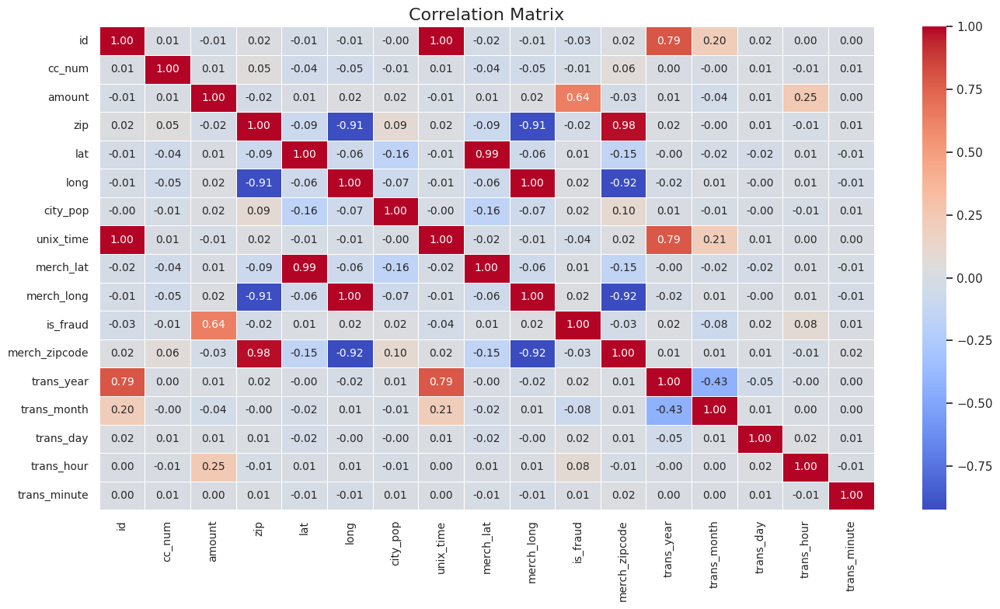

In [ ]:
numeric_df = df.select_dtypes(include=np.number)
corr_matrix = numeric_df.corr()

plt.figure(figsize=(14, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 10})
plt.title('Correlation Matrix', fontsize=16)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

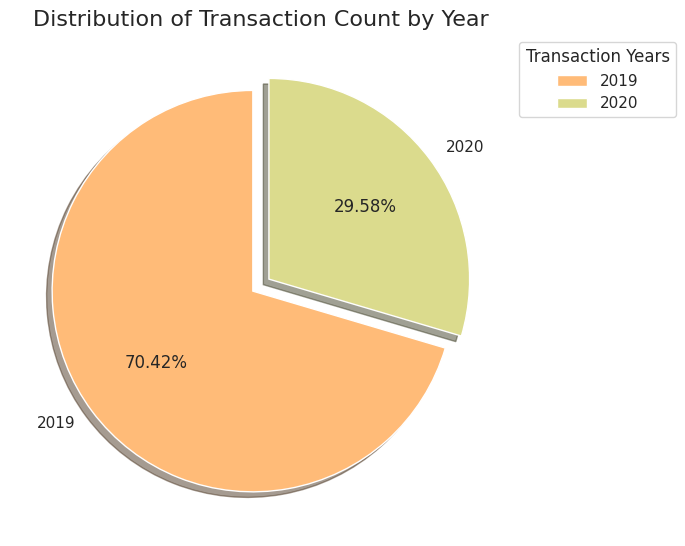

In [ ]:
df_group_years = df.groupby(['trans_year']).trans_year.count()
colors = plt.get_cmap('tab20')(np.linspace(0.15, 0.85, len(df_group_years)))

plt.figure(figsize=(7, 7))
plt.pie(df_group_years, labels=df_group_years.index, autopct='%1.2f%%', startangle=90,
        colors=colors, explode=[0.05]*len(df_group_years), shadow=True)

plt.title('Distribution of Transaction Count by Year', fontsize=16)
plt.legend(title="Transaction Years", loc="upper left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

In [ ]:
df.groupby("cc_num").cc_num.count()

,cc_num
cc_num,
60416207185,17
60422928733,27
60423098130,17
60427851591,14
60487002085,5
...,...
4958589671582726883,11
4973530368125489546,16
4980323467523543940,19


In [ ]:
fraud_per_category = df[df['is_fraud'] == 1].groupby('category')['is_fraud'].count()
total_per_category = df.groupby('category')['is_fraud'].count()

fraud_ratio_per_category = fraud_per_category / total_per_category

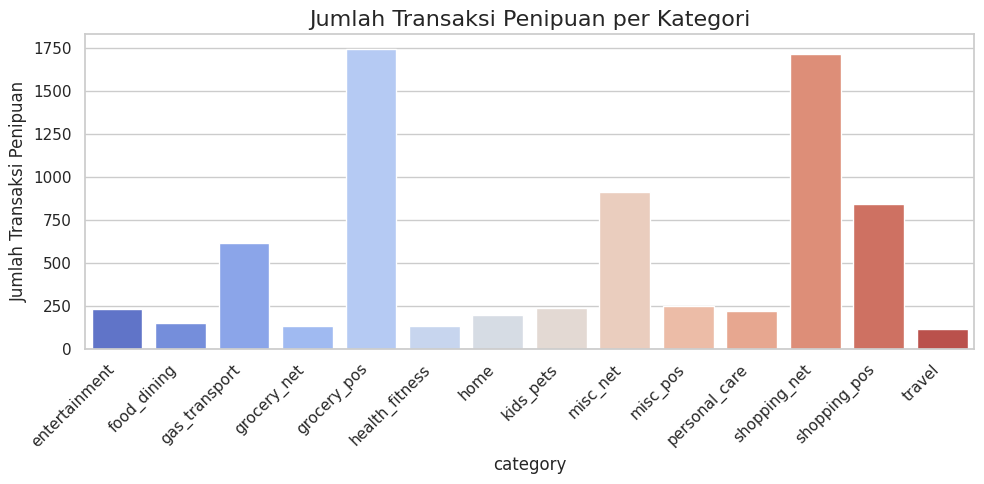

In [ ]:
plt.figure(figsize=(10, 5))
sns.barplot(x=fraud_per_category.index, y=fraud_per_category.values, palette='coolwarm')
plt.title('Jumlah Transaksi Penipuan per Kategori', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Jumlah Transaksi Penipuan')
plt.tight_layout()
plt.show()

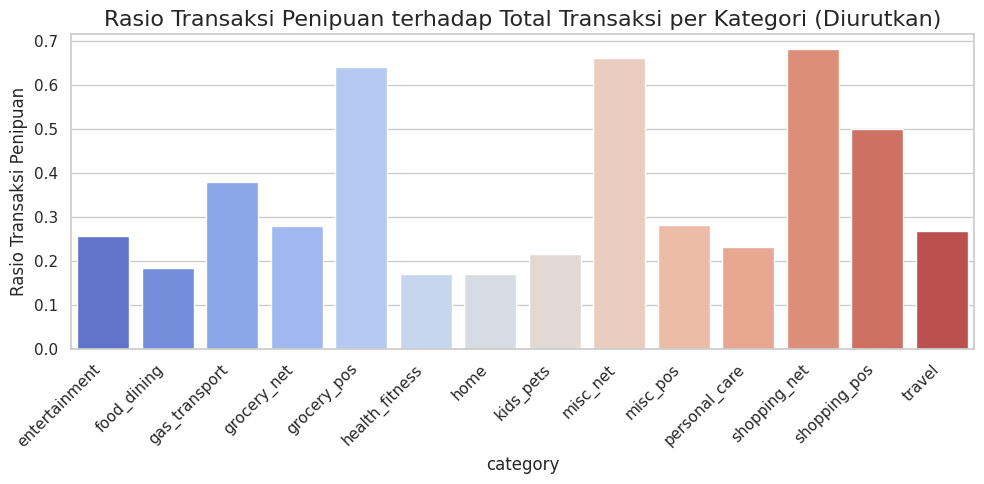

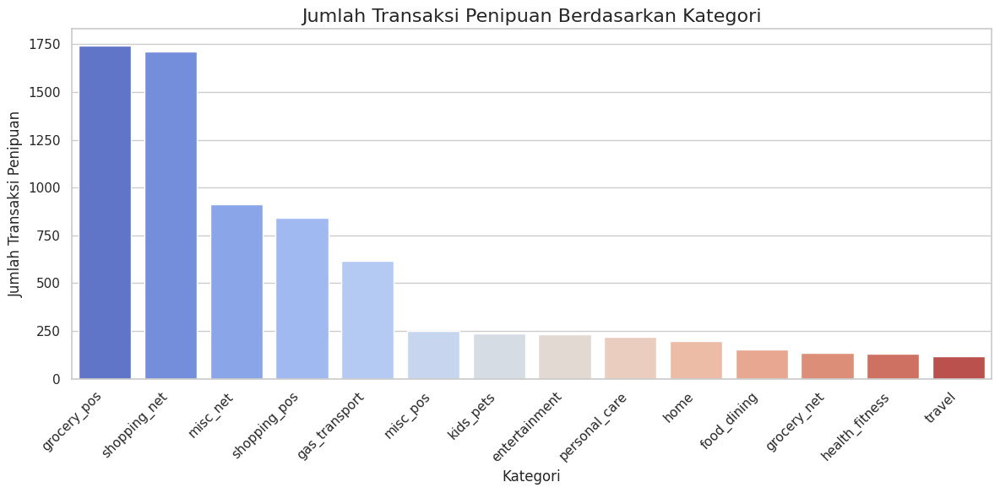

In [ ]:
fraud_ratio_per_category_sorted = fraud_ratio_per_category.sort_values(ascending=False)

plt.figure(figsize=(10, 5))
sns.barplot(x=fraud_ratio_per_category_sorted.index, y=fraud_ratio_per_category_sorted.values, palette='coolwarm')
plt.title('Rasio Transaksi Penipuan terhadap Total Transaksi per Kategori (Diurutkan)', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Rasio Transaksi Penipuan')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(x='category', data=df[df['is_fraud'] == 1],
              order=df[df['is_fraud'] == 1].category.value_counts().index,
              palette='coolwarm')
plt.title('Jumlah Transaksi Penipuan Berdasarkan Kategori', fontsize=16)
plt.xlabel('Kategori', fontsize=12)
plt.ylabel('Jumlah Transaksi Penipuan', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

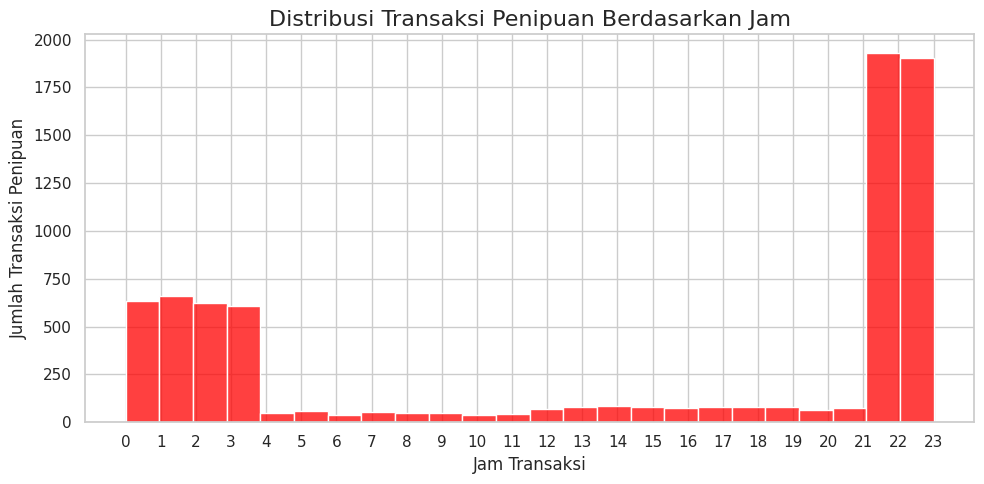

In [ ]:
fraud_data = df[df['is_fraud'] == 1]

plt.figure(figsize=(10, 5))
sns.histplot(fraud_data['trans_hour'], bins=24, kde=False, color='red')
plt.title('Distribusi Transaksi Penipuan Berdasarkan Jam', fontsize=16)
plt.xlabel('Jam Transaksi', fontsize=12)
plt.ylabel('Jumlah Transaksi Penipuan', fontsize=12)
plt.xticks(range(0, 24))
plt.tight_layout()
plt.show()

In [ ]:
fraud_data['trans_dayofweek'] = fraud_data['trans_date_trans_time'].dt.dayofweek
fraud_data.head()

,id,trans_date_trans_time,cc_num,merchant,category,amount,first,last,gender,street,...,merch_lat,merch_long,is_fraud,merch_zipcode,trans_year,trans_month,trans_day,trans_hour,trans_minute,trans_dayofweek
10000,2449,2019-01-02 01:06:37,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.059998,Jason,Murphy,M,542 Steve Curve Suite 011,...,36.430124,-81.179483,1,28644.0,2019,1,2,1,6,2
10001,2472,2019-01-02 01:47:29,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.520000,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.819364,-99.142791,1,78055.0,2019,1,2,1,47,2
10002,2523,2019-01-02 03:05:23,340187018810220,fraud_Goodwin-Nitzsche,grocery_pos,276.309998,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.273085,-98.836360,1,78039.0,2019,1,2,3,5,2
10003,2546,2019-01-02 03:38:03,4613314721966,fraud_Erdman-Kertzmann,gas_transport,7.030000,Jason,Murphy,M,542 Steve Curve Suite 011,...,35.909292,-82.091010,1,28777.0,2019,1,2,3,38,2
10004,2553,2019-01-02 03:55:47,340187018810220,fraud_Koepp-Parker,grocery_pos,275.730011,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.786426,-98.683410,1,78006.0,2019,1,2,3,55,2


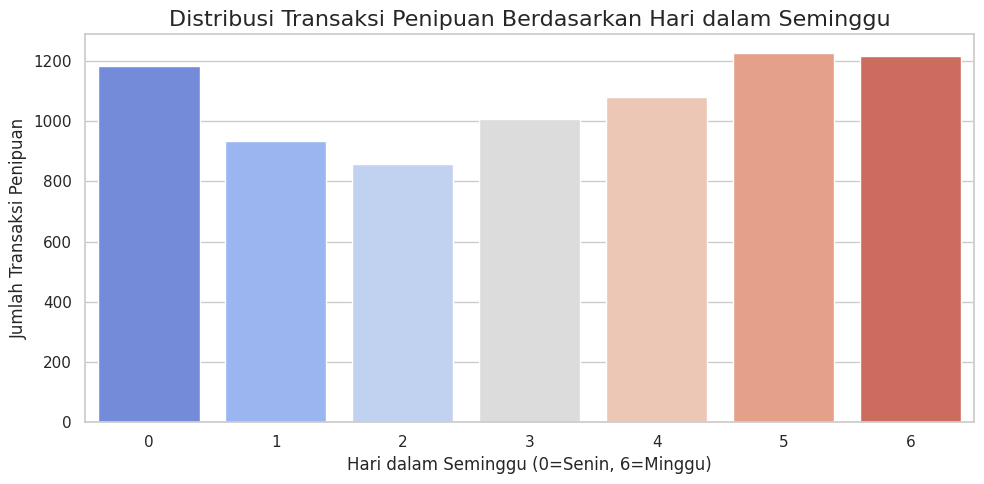

In [ ]:
plt.figure(figsize=(10, 5))
sns.countplot(x='trans_dayofweek', data=fraud_data, palette='coolwarm')
plt.title('Distribusi Transaksi Penipuan Berdasarkan Hari dalam Seminggu', fontsize=16)
plt.xlabel('Hari dalam Seminggu (0=Senin, 6=Minggu)', fontsize=12)
plt.ylabel('Jumlah Transaksi Penipuan', fontsize=12)
plt.tight_layout()
plt.show()

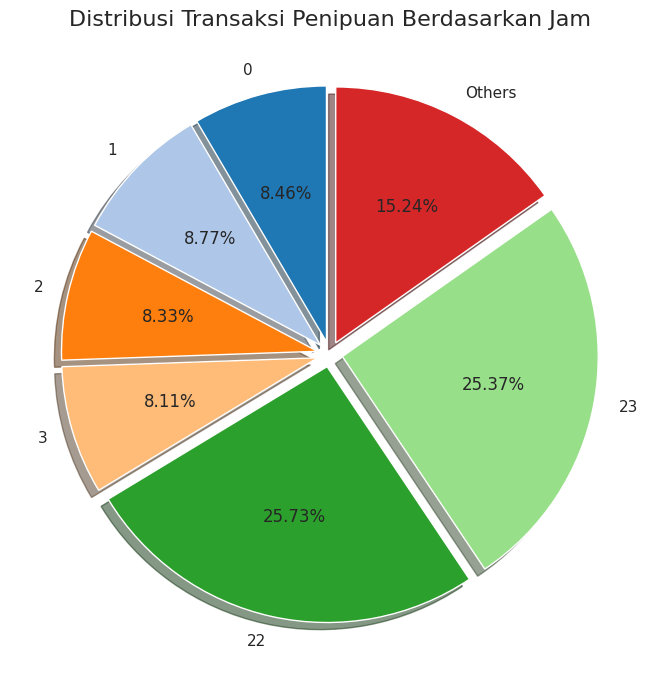

In [ ]:
fraud_time_counts = df[df['is_fraud'] == True].groupby('trans_hour')['id'].count()

total = fraud_time_counts.sum()
threshold = 0.02 * total
small_counts = fraud_time_counts[fraud_time_counts <= threshold].sum()
fraud_time_counts_filtered = fraud_time_counts[fraud_time_counts > threshold]
fraud_time_counts_filtered['Others'] = small_counts

colors = plt.get_cmap('tab20')(range(len(fraud_time_counts_filtered)))

plt.figure(figsize=(7, 7))
plt.pie(fraud_time_counts_filtered, labels=fraud_time_counts_filtered.index, autopct='%1.2f%%',
        startangle=90, colors=colors, explode=[0.05]*len(fraud_time_counts_filtered), shadow=True)

plt.title('Distribusi Transaksi Penipuan Berdasarkan Jam', fontsize=16)
plt.tight_layout()
plt.show()

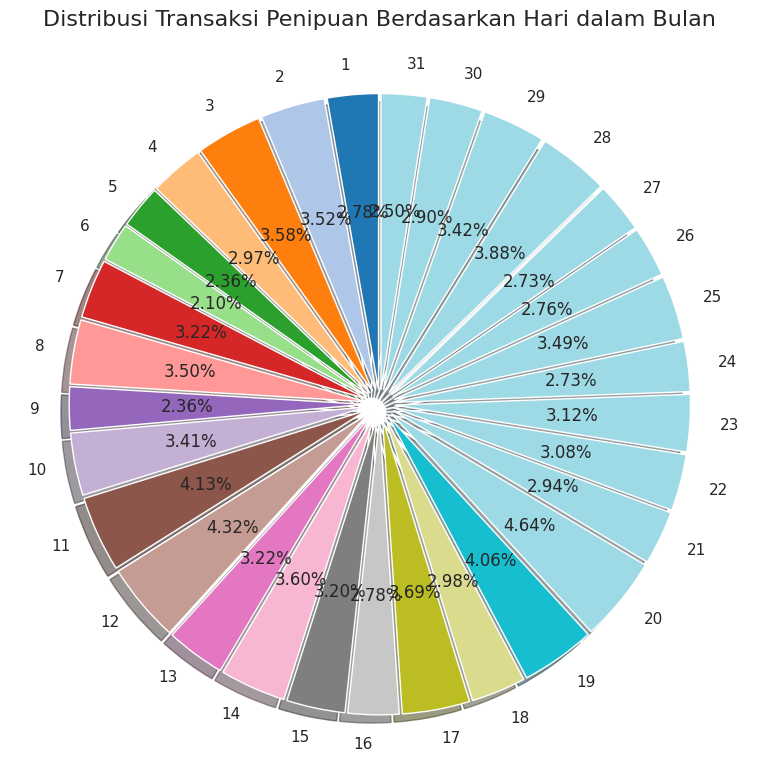

In [ ]:
fraud_time_counts = df[df['is_fraud'] == True].groupby('trans_day')['id'].count()

colors = plt.get_cmap('tab20')(range(len(fraud_time_counts)))

plt.figure(figsize=(8, 8))
plt.pie(fraud_time_counts, labels=fraud_time_counts.index, autopct='%1.2f%%', startangle=90,
        colors=colors, explode=[0.05] * len(fraud_time_counts), shadow=True)

plt.title('Distribusi Transaksi Penipuan Berdasarkan Hari dalam Bulan', fontsize=16)
plt.tight_layout()
plt.show()

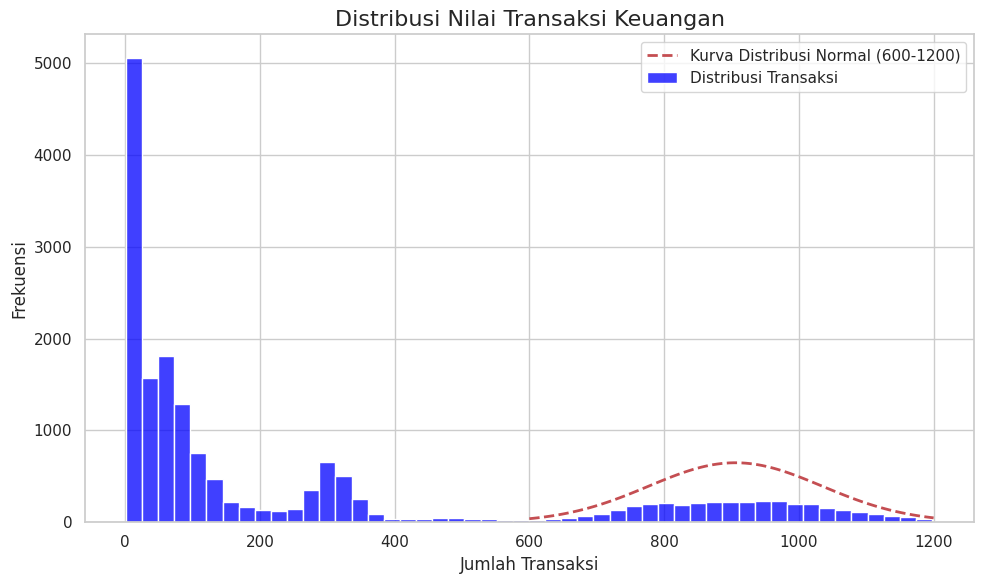

In [ ]:
df_filtered = df[(df['amount'] >= 0) & (df['amount'] <= 1200)]

plt.figure(figsize=(10, 6))
sns.histplot(df_filtered['amount'], bins=50, kde=False, color='blue', label='Distribusi Transaksi')

mu, std = norm.fit(df_filtered[(df_filtered['amount'] >= 600) & (df_filtered['amount'] <= 1200)]['amount'])
xmin, xmax = 600, 1200
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std) * len(df_filtered) * (1200 - 600) / 50
plt.plot(x, p, 'r--', linewidth=2, label='Kurva Distribusi Normal (600-1200)')
plt.title('Distribusi Nilai Transaksi Keuangan', fontsize=16)
plt.xlabel('Jumlah Transaksi', fontsize=12)
plt.ylabel('Frekuensi', fontsize=12)
plt.legend()


plt.tight_layout()
plt.show()

In [ ]:
fraud_df = df[df['is_fraud'] == True]
map_center = [fraud_df['lat'].mean(), fraud_df['long'].mean()]
my_map = folium.Map(location=map_center, zoom_start=6, prefer_canvas=True)

marker_cluster = MarkerCluster().add_to(my_map)

for index, row in fraud_df.iterrows():
    if index < 150000:
        popup_text = f"""
        <strong>Transaction Amount:</strong> ${row['amount']:.2f}<br>
        <strong>City Population:</strong> {row['city_pop']:,}<br>
        <strong>Date:</strong> {row['trans_date_trans_time']}<br>
        <strong>Coordinates:</strong> ({row['lat']}, {row['long']})
        """
        folium.Marker(
            location=[row['lat'], row['long']],
            popup=folium.Popup(popup_text, max_width=300),
            icon=folium.Icon(color='red', icon='info-sign')
        ).add_to(marker_cluster)

my_map

In [ ]:
city_counts = df.groupby(['lat', 'long'])['id'].count().reset_index(name='total_transactions')
fraud_counts = df[df['is_fraud'] == True].groupby(['lat', 'long'])['id'].count().reset_index(name='fraud_transactions')

map_center = [df['lat'].mean(), df['long'].mean()]
my_map = folium.Map(location=map_center, zoom_start=5, prefer_canvas=True)

marker_cluster = MarkerCluster().add_to(my_map)

for index, row in city_counts.iterrows():
    lat = row['lat']
    lon = row['long']
    total_transactions = row['total_transactions']

    fraud_row = fraud_counts[(fraud_counts['lat'] == lat) & (fraud_counts['long'] == lon)]
    fraud_count = fraud_row['fraud_transactions'].values[0] if not fraud_row.empty else 0

    fraud_percentage = (fraud_count / total_transactions) * 100 if total_transactions > 0 else 0

    popup_text = f"""
    <strong>Total Transactions:</strong> {total_transactions:,}<br>
    <strong>Fraudulent Transactions:</strong> {fraud_count:,}<br>
    <strong>Fraud Percentage:</strong> {fraud_percentage:.2f}%<br>
    <strong>Coordinates:</strong> ({lat}, {lon})
    """

    if fraud_percentage == 0:
        marker_color = 'green'
    elif fraud_percentage < 10:
        marker_color = 'blue'
    elif fraud_percentage < 30:
        marker_color = 'orange'
    else:
        marker_color = 'red'

    folium.Marker(
        location=[lat, lon],
        popup=folium.Popup(popup_text, max_width=300),
        icon=folium.Icon(color=marker_color)
    ).add_to(marker_cluster)

my_map


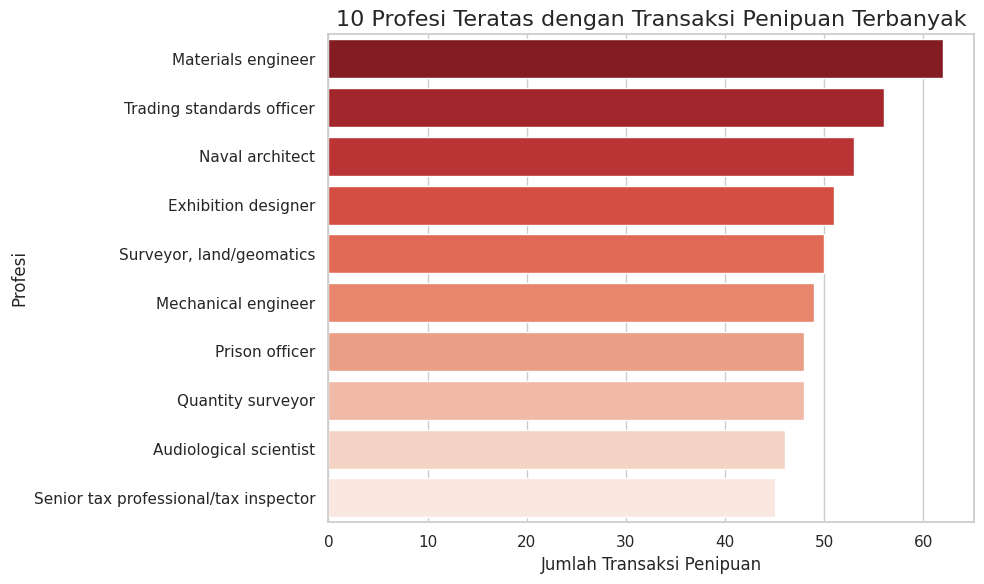

In [ ]:
top_professions = df[df['is_fraud'] == True].groupby('job')['id'].count().reset_index(name='fraud_transactions')

top_professions = top_professions.sort_values(by='fraud_transactions', ascending=False).head(10)

plt.figure(figsize=(10, 6))
sns.barplot(x='fraud_transactions', y='job', data=top_professions, palette='Reds_r')

plt.title('10 Profesi Teratas dengan Transaksi Penipuan Terbanyak', fontsize=16)
plt.xlabel('Jumlah Transaksi Penipuan', fontsize=12)
plt.ylabel('Profesi', fontsize=12)
plt.tight_layout()

plt.show()

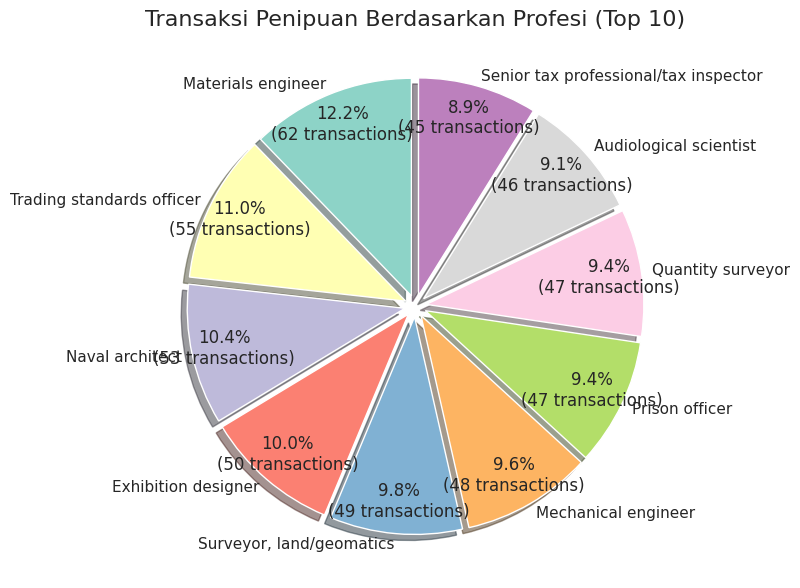

In [ ]:
fraud_job_counts = df[df['is_fraud'] == True].groupby('job')['id'].count()

top_10_fraud_jobs = fraud_job_counts.sort_values(ascending=False).head(10)

colors = plt.get_cmap('Set3')(range(len(top_10_fraud_jobs)))

plt.figure(figsize=(8, 8))
plt.pie(top_10_fraud_jobs,
        labels=top_10_fraud_jobs.index,
        autopct=lambda p: f'{p:.1f}%\n({int(p * top_10_fraud_jobs.sum() / 100):,} transactions)',
        startangle=90,
        colors=colors,
        explode=[0.05] * len(top_10_fraud_jobs),
        shadow=True,
        pctdistance=0.85,
        labeldistance=1.05)

plt.title('Transaksi Penipuan Berdasarkan Profesi (Top 10)', fontsize=16)
plt.tight_layout()

plt.show()

In [ ]:
df['dob'] = pd.to_datetime(df['dob'], errors='coerce')
df['age'] = pd.to_datetime('today').year - df['dob'].dt.year

columns_to_drop = ["id", "cc_num", "first", "last", "trans_num", "merch_zipcode", "zip", "unix_time", "street", "dob", "trans_month", "trans_day", "trans_minute"]
df.drop(columns=columns_to_drop, inplace=True)

In [ ]:
df

,trans_date_trans_time,merchant,category,amount,gender,city,state,lat,long,city_pop,job,merch_lat,merch_long,is_fraud,trans_year,trans_hour,age
0,2019-12-07 10:55:06,"fraud_Zieme, Bode and Dooley",gas_transport,86.190002,F,Santa Monica,CA,34.028702,-118.492401,92043,"Civil engineer, contracting",33.287851,-118.740970,0,2019,10,63
1,2020-04-03 13:10:06,fraud_Lind-Buckridge,entertainment,85.809998,F,Matthews,MO,36.715401,-89.628700,1019,Aeronautical engineer,36.539950,-89.857416,0,2020,13,45
2,2019-12-04 07:07:04,fraud_Hackett-Lueilwitz,grocery_pos,99.300003,F,Keisterville,PA,39.963600,-79.785301,184,Systems developer,39.582872,-78.838550,0,2019,7,79
3,2019-06-30 18:43:08,fraud_Lynch-Wisozk,home,42.090000,F,Heart Butte,MT,48.277699,-112.845596,743,Water engineer,48.310513,-112.837535,0,2019,18,52
4,2019-04-15 19:57:49,fraud_Fisher-Schowalter,shopping_net,4.240000,F,Kingsport,TN,36.471500,-82.483398,87124,Warden/ranger,37.329094,-82.070746,0,2019,19,37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17501,2020-06-21 01:00:08,fraud_Kassulke PLC,shopping_net,977.010010,F,Vero Beach,FL,27.632999,-80.403099,105638,"Librarian, public",26.888686,-80.834389,1,2020,1,38
17502,2020-06-21 01:53:35,fraud_Schumm PLC,shopping_net,1210.910034,F,Vero Beach,FL,27.632999,-80.403099,105638,"Librarian, public",28.216707,-79.855648,1,2020,1,38
17503,2020-06-21 02:16:56,"fraud_Tillman, Dickinson and Labadie",gas_transport,10.240000,M,Denham Springs,LA,30.459000,-90.902702,71335,Herbalist,29.700456,-91.361632,1,2020,2,30
17504,2020-06-21 03:26:20,fraud_Corwin-Collins,gas_transport,21.690001,F,Notrees,TX,31.859900,-102.741302,23,Cytogeneticist,32.675272,-103.484949,1,2020,3,55


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17506 entries, 0 to 17505
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   trans_date_trans_time  17506 non-null  datetime64[ns]
 1   merchant               17506 non-null  category      
 2   category               17506 non-null  category      
 3   amount                 17506 non-null  float32       
 4   gender                 17506 non-null  category      
 5   city                   17506 non-null  object        
 6   state                  17506 non-null  object        
 7   lat                    17506 non-null  float32       
 8   long                   17506 non-null  float32       
 9   city_pop               17506 non-null  int64         
 10  job                    17506 non-null  object        
 11  merch_lat              17506 non-null  float64       
 12  merch_long             17506 non-null  float64       
 13  i

In [ ]:
df['merch_lat'] = df['merch_lat'].astype('float32')
df['merch_long'] = df['merch_long'].astype('float32')

In [ ]:
def normalizers(df, batch_size=10000):
    numeric_df = df.select_dtypes(include=np.number).drop(columns=["is_fraud"], axis=1)
    scaler = StandardScaler()

    normalized_list = []
    for i in range(0, len(numeric_df), batch_size):
        batch = numeric_df.iloc[i:i+batch_size]
        normalized_batch = scaler.fit_transform(batch)
        normalized_list.append(pd.DataFrame(normalized_batch, columns=batch.columns))

        gc.collect()

    numeric_df_normalized = pd.concat(normalized_list, ignore_index=True)
    return numeric_df_normalized

def encoder_exp(df):
    object_df = df.select_dtypes(include="object")
    object_df_encoded = pd.get_dummies(object_df, sparse=True)
    gc.collect()
    return object_df_encoded

def preprocess(df, batch_size=10000):
    numerics = normalizers(df, batch_size=batch_size)
    objects = encoder_exp(df)

    combined_df = pd.concat([numerics, objects, df[["is_fraud"]]], axis=1)

    gc.collect()

    return combined_df

preprocessed_df = preprocess(df, batch_size=10000)


In [ ]:
df_train, df_test = train_test_split(preprocessed_df, test_size=0.2, random_state=42, shuffle=True)
print(f'train size: {df_train.shape}, test size: {df_test.shape}')

train size: (14004, 1448), test size: (3502, 1448)


In [ ]:
X_train= df_train.drop('is_fraud', axis=1)
y_train= df_train['is_fraud']
X_test= df_test.drop('is_fraud', axis=1)
y_test= df_test['is_fraud']

In [ ]:
def clear_memory():
    gc.collect()


def model_report(model):
    model.fit(X_train, y_train)
    y_pred= model.predict(X_test)
    clear_memory()
    print(f'Classification Report:\n{classification_report(y_test, y_pred)}')
    disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred))
    disp.plot(cmap=plt.cm.Blues)
    plt.show()

# def model_report(model):
#     model.fit(X_train, y_train)
#     y_pred= model.predict(X_test)
#     clear_memory()
#     print(f'Classification Report:\n{classification_report(y_test, y_pred)}')
#     ConfusionMatrixDisplay(confusion_matrix=confusion_matrix(y_test, y_pred)).plot()
#     plt.show()

def model_score_cv(model):
    return cross_val_score(model, X_train, y_train, scoring='recall', cv=5)

# def model_score_cv(model):
#     X_new = np.concatenate((X_train, X_test), axis=0)
#     y_new = np.concatenate((y_train, y_test), axis=0)
#     return cross_val_score(model, X_new, y_new, scoring='recall', cv=5)


Evaluating Logistic Regression

Logistic Regression - Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.79      0.74      2022
           1       0.66      0.54      0.59      1480

    accuracy                           0.69      3502
   macro avg       0.68      0.67      0.67      3502
weighted avg       0.68      0.69      0.68      3502



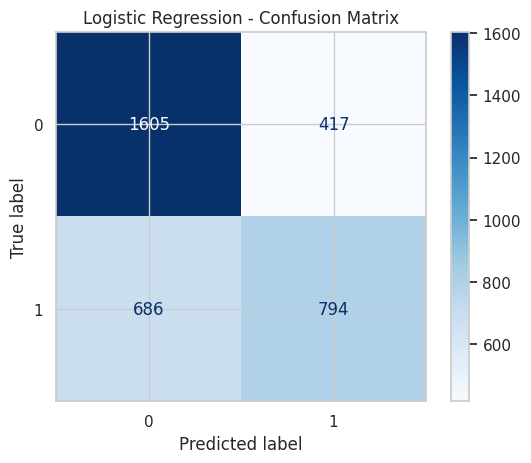

Recall with Stratified K-Folds for Logistic Regression: 0.5340

Evaluating Decision Tree

Decision Tree - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2022
           1       1.00      1.00      1.00      1480

    accuracy                           1.00      3502
   macro avg       1.00      1.00      1.00      3502
weighted avg       1.00      1.00      1.00      3502



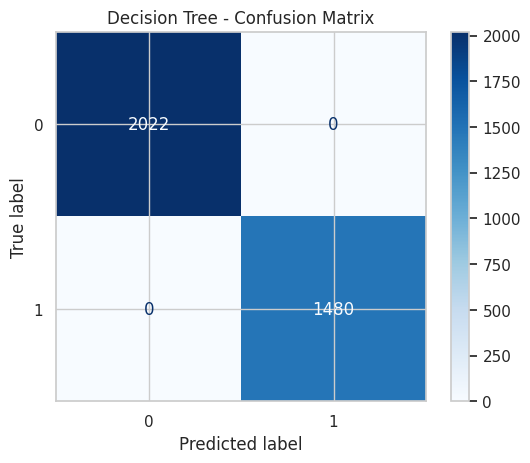

Recall with Stratified K-Folds for Decision Tree: 1.0000

Evaluating Random Forest

Random Forest - Classification Report:
              precision    recall  f1-score   support

           0       0.88      1.00      0.94      2022
           1       1.00      0.82      0.90      1480

    accuracy                           0.92      3502
   macro avg       0.94      0.91      0.92      3502
weighted avg       0.93      0.92      0.92      3502



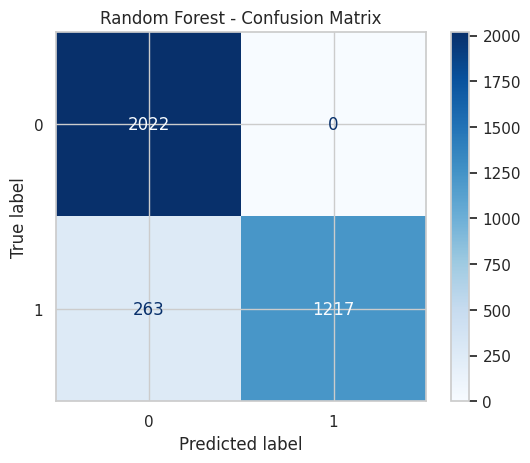

Recall with Stratified K-Folds for Random Forest: 0.8380

Evaluating SVM

SVM - Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      2022
           1       0.90      0.77      0.83      1480

    accuracy                           0.87      3502
   macro avg       0.88      0.86      0.86      3502
weighted avg       0.87      0.87      0.87      3502



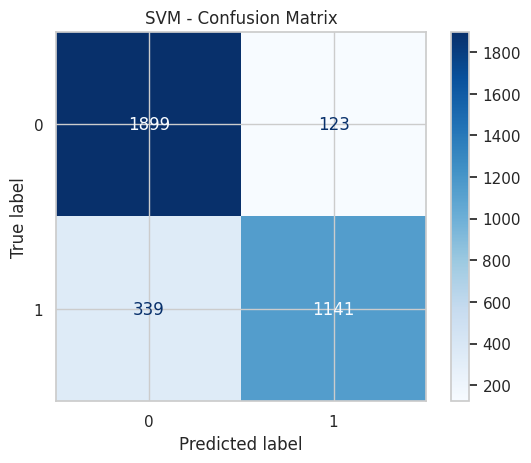

Recall with Stratified K-Folds for SVM: 0.7647

Evaluating Gradient Boosting

Gradient Boosting - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2022
           1       1.00      1.00      1.00      1480

    accuracy                           1.00      3502
   macro avg       1.00      1.00      1.00      3502
weighted avg       1.00      1.00      1.00      3502



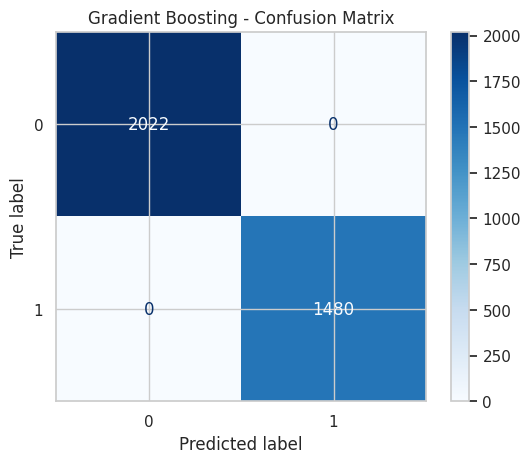

Recall with Stratified K-Folds for Gradient Boosting: 1.0000

Evaluating AdaBoost

AdaBoost - Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2022
           1       1.00      1.00      1.00      1480

    accuracy                           1.00      3502
   macro avg       1.00      1.00      1.00      3502
weighted avg       1.00      1.00      1.00      3502



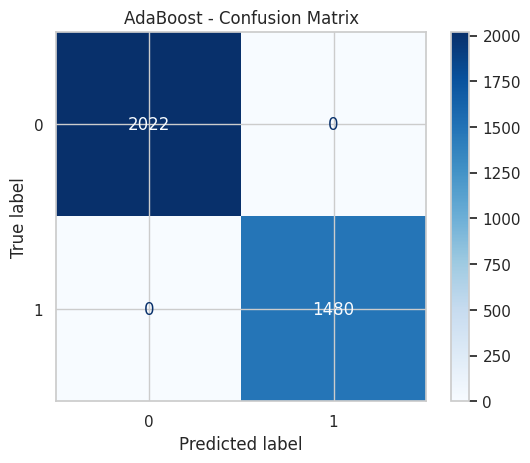

Recall with Stratified K-Folds for AdaBoost: 1.0000


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import joblib

models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(max_depth=10),
    "Random Forest": RandomForestClassifier(n_estimators=100, max_depth=10),
    "SVM": SVC(kernel='rbf'),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, max_depth=10),
    "AdaBoost": AdaBoostClassifier(n_estimators=100)
}

def model_report(model, model_name):
    model.fit(X_train, y_train)
    joblib.dump(model, f'{model_name}.joblib')

    y_pred = model.predict(X_test)

    clear_memory()

    print(f'\n{model_name} - Classification Report:')
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.show()

for model_name, model in models.items():
    print(f"\nEvaluating {model_name}")

    model_report(model, model_name)

    skf = StratifiedKFold(n_splits=5)
    scores = cross_val_score(model, X_train, y_train, scoring='recall', cv=skf)
    print(f"Recall with Stratified K-Folds for {model_name}: {scores.mean():.4f}")
